In [13]:
import os, sys, json
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
sys.path.append('..')
from oads_access.oads_access import OADS_Access

In [15]:
%matplotlib widget
home = '../../data/oads/examples/'
oads = OADS_Access(home)

In [216]:
oads.get_maximum_annotation_size()

(629, 933)

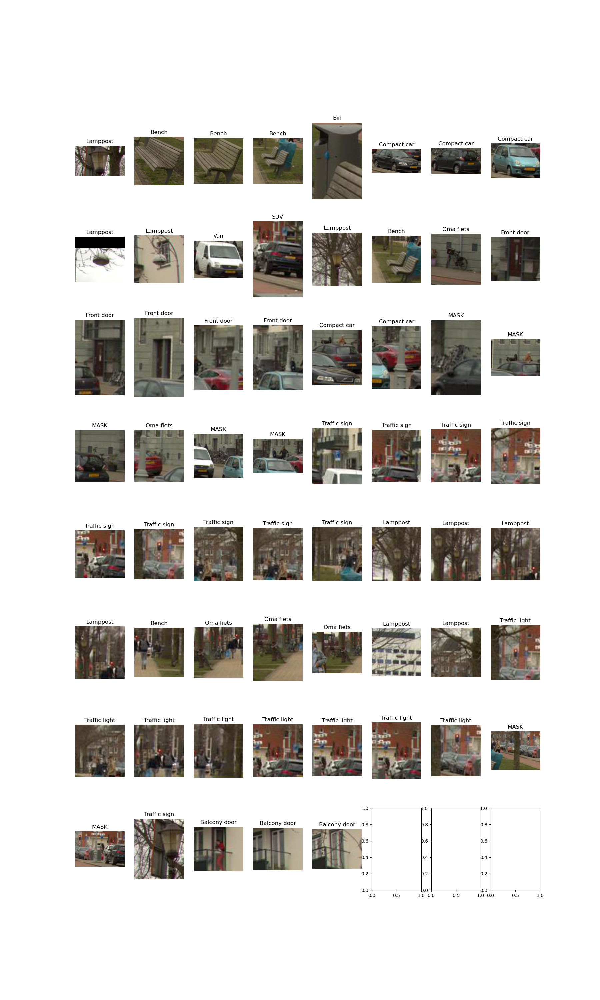

In [213]:
fig = plot_crops_from_data_tuple(data[7], min_size=(50, 50))

In [17]:
data = oads.get_data_iterator()


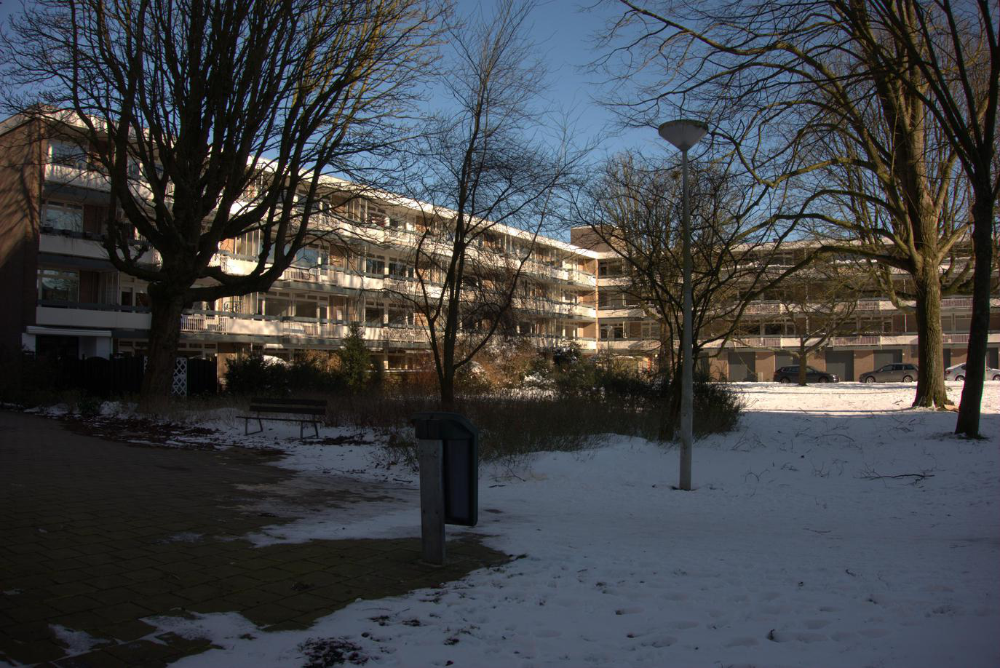

In [18]:
data[0][0]

In [ ]:

fig, ax = plt.subplots(1,2, figsize=(10, 5))
for (img, label), axis in zip(data[9:], ax):
    axis.imshow(img)
    add_label_box_to_axis(label, axis, add_title=True)
    # axis.set_title(label)
    axis.axis('off')

In [119]:
annotation = oads.get_annotation(oads.datasets[1], oads.image_names[oads.datasets[1]][0])

# Downsample the resolution like a gaussian filter
Such that the resolution in the middle of the annotation box is basically kept and the resolution decrease towards the edges of the image

In [235]:
_x = np.array(data[0][0])

1. Create Gaussian with same size as data
2. Normalize between 0 and 1
3. Interpret each entry as probability on whether the pixel is kept

In [286]:
height = data[0][1]['size']['height']
width = data[0][1]['size']['width']

In [305]:
x_grid = np.linspace(0, width, width, endpoint=True)
y_grid = np.linspace(0, height, height, endpoint=True)
x, y = np.meshgrid(x_grid, y_grid)

sigma = 60
mu = (60.0, 60.0)

gaussian = np.exp(-((x-mu[0])**2 + (y-mu[0])**2) / (2*sigma**2)) / (2 * np.pi * sigma**2)

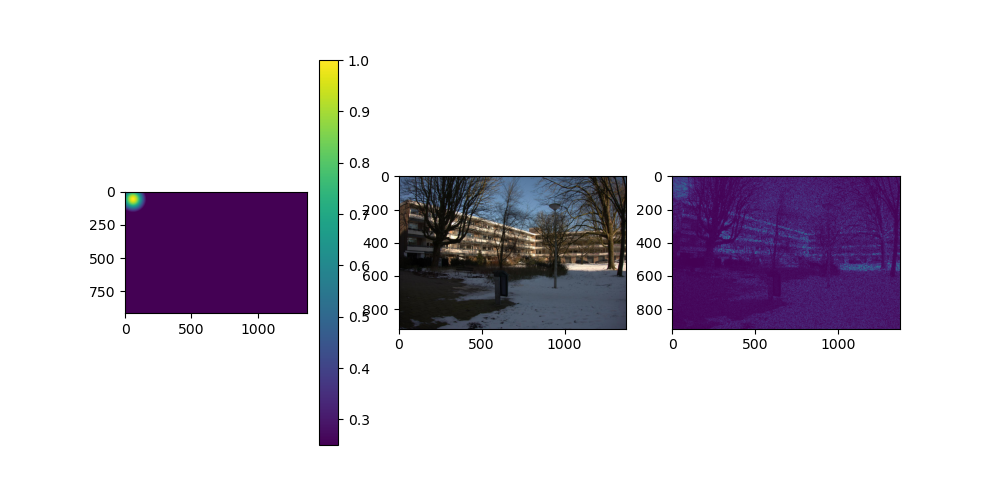

In [306]:
fig, ax = plt.subplots(1,3, figsize=(10,5))
norm = gaussian / np.max(gaussian)
norm = np.where(norm<0.25, 0.25, norm)
bar = ax[0].imshow(norm)
plt.colorbar(bar, ax=ax[0])

ax[1].imshow(data[0][0])

samples = np.random.random((height, width))
# samples = np.where(samples<norm, True, False)
ax[2].imshow(np.where(samples<norm, np.array(data[0][0])[:,:,0], 0))

(array([ 8., 12.,  6., 13., 11., 10., 10., 10.,  8., 12.]),
 array([0.00336121, 0.10182743, 0.20029365, 0.29875988, 0.3972261 ,
        0.49569232, 0.59415854, 0.69262477, 0.79109099, 0.88955721,
        0.98802344]),
 <BarContainer object of 10 artists>)

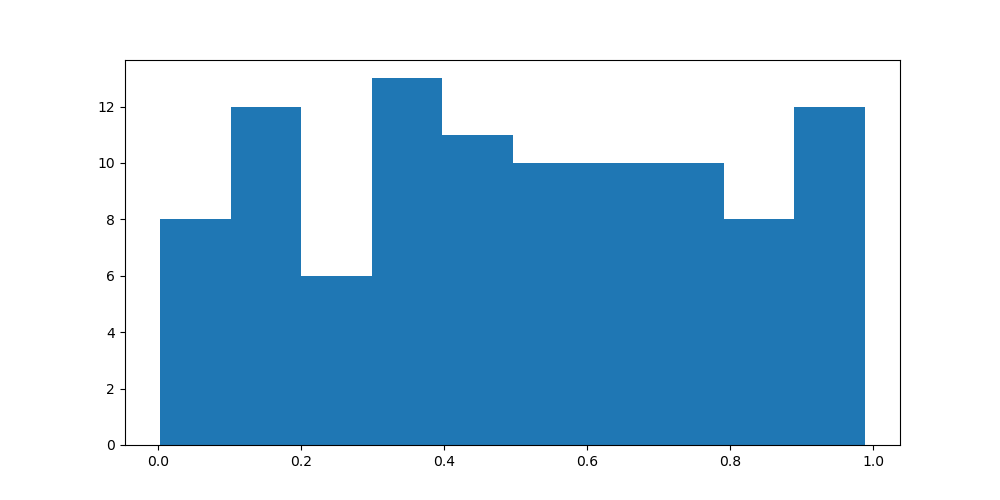

In [244]:
fig, ax = plt.subplots(1,1, figsize=(10,5))

ax.hist(np.random.random(size=(100)).flatten())

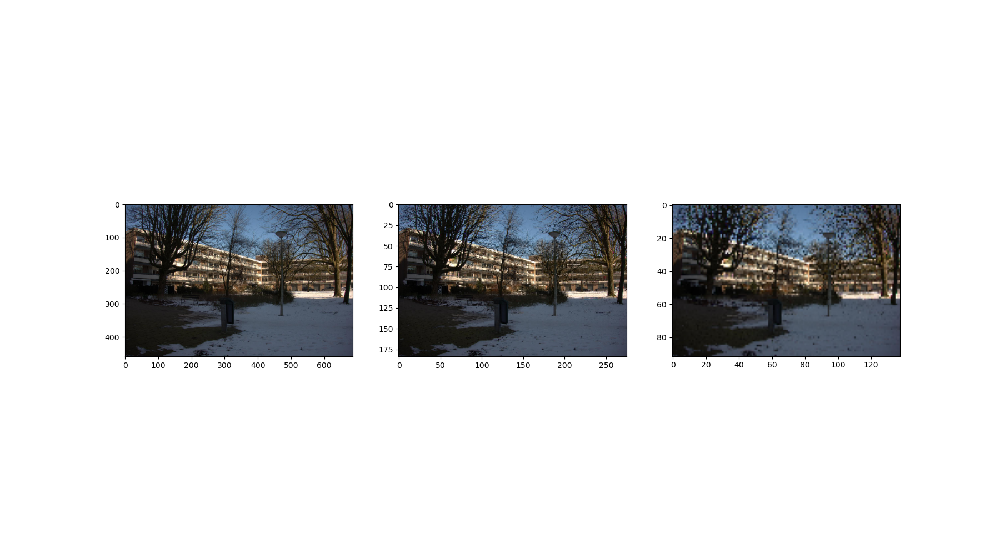

In [226]:
fig, ax = plt.subplots(1,3, figsize=(18,10))

ax[0].imshow(Image.fromarray(_x[::2,::2,:]))
ax[1].imshow(Image.fromarray(_x[::5,::5,:]))
ax[2].imshow(Image.fromarray(_x[::10,::10,:]))